# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:05:18 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 3.12 s (started: 2022-12-13 13:05:18 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 16 ms (started: 2022-12-13 13:05:21 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 219 ms (started: 2022-12-13 13:05:21 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 15 ms (started: 2022-12-13 13:05:21 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 203 ms (started: 2022-12-13 13:05:21 +09:00)


In [7]:
x_train_filter_0 = np.where(y_train == 6)
x_test_filter_0 = np.where(y_test == 6)

X_train = x_train[x_train_filter_0]
X_test = x_test[x_test_filter_0]
Y_train = y_train[x_train_filter_0]
Y_test = y_test[x_test_filter_0]

time: 0 ns (started: 2022-12-13 13:05:21 +09:00)


In [8]:
X_train.shape

(5918, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:05:21 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 62 ms (started: 2022-12-13 13:05:21 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 0 ns (started: 2022-12-13 13:05:21 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 0 ns (started: 2022-12-13 13:05:21 +09:00)


In [12]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 78 ms (started: 2022-12-13 13:05:21 +09:00)


In [13]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.046657080698393576
iteration:  5  cost:  0.03923148379824465
iteration:  10  cost:  0.03428134915056944
iteration:  15  cost:  0.029372350398216732
iteration:  20  cost:  0.02282365226870995
iteration:  25  cost:  0.018449165731869437
iteration:  30  cost:  0.015542820452673536
iteration:  35  cost:  0.01455985129450788
iteration:  40  cost:  0.015018145020442382
iteration:  45  cost:  0.010526961754413283
iteration:  50  cost:  0.00891548427889357
iteration:  55  cost:  0.009089448240140853
iteration:  60  cost:  0.012211187104042693
iteration:  65  cost:  0.007070566575525513
iteration:  70  cost:  0.009352645923338811
iteration:  75  cost:  0.008635982156415345
iteration:  80  cost:  0.008147061632712019
iteration:  85  cost:  0.009500510608710778
iteration:  90  cost:  0.006604207926657898
iteration:  95  cost:  0.007999699665557384
iteration:  100  cost:  0.006840944205157168
iteration:  105  cost:  0.006602603793399015
iteration:  110  cost:  0.00497875532

In [14]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([ 0.19746053, -1.72304885, -0.06702343,  0.70915035,  0.24716251,
        -0.06480534,  0.10475421, -0.72052383,  1.49118225, -0.70038548,
        -0.47193085, -0.15102437,  0.74914325,  0.92809545, -1.07107727,
         0.79578923, -0.78585359, -0.98951347, -0.18180036,  0.95415679,
         0.39939454,  0.51403091, -0.75829465, -2.11657343,  1.37112176,
        -0.77667377, -0.36208301, -0.99000911,  0.73867314,  0.43126455,
         1.46235145,  0.63199206,  0.83982676,  1.55647759,  0.24800564,
        -1.08270659,  2.58008482,  1.16548234,  0.84378089,  0.62789454,
         0.9670641 ,  0.55030425, -2.53070077, -2.0295453 ,  0.33501577,
        -0.68638112, -0.87189627,  1.2263187 , -0.41087757,  0.38556269,
         0.1138786 , -0.25745661,  0.10095404,  1.03660223, -1.53995618,
        -0.23032891,  0.84429157, -0.11849599, -0.27497589,  0.81208501,
        -0.9938983 ,  0.76564676,  1.19117809, -1.07767835,  0.11476355,
        -0.56884421, -0.13083073,  0.97303623,  0.9

time: 16 ms (started: 2022-12-14 02:45:25 +09:00)


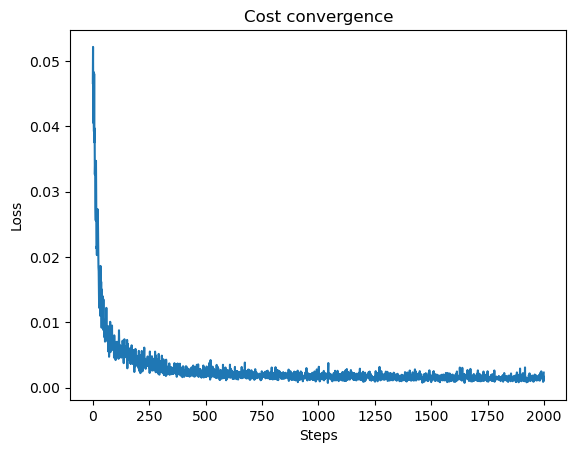

time: 579 ms (started: 2022-12-14 02:45:25 +09:00)


In [15]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC6/qsvdd/cost_qcnn.png')

In [16]:
savetxt('./img/OCC6/qsvdd/param_list_qcnn',est_params.numpy(),delimiter=',')

time: 0 ns (started: 2022-12-14 02:45:25 +09:00)


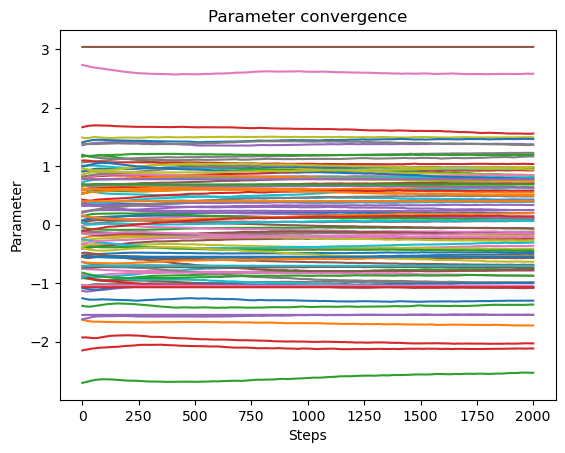

time: 500 ms (started: 2022-12-14 02:45:25 +09:00)


In [17]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC6/qsvdd/parameters_qcnn.png')

### train result

In [18]:
# Implement trained circuit for MNIST "1" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 57min 47s (started: 2022-12-14 02:45:26 +09:00)


In [19]:
predictions_exp0

tensor([[-0.001578  , -0.00045666,  0.00933518,  0.00495272,  0.00689531,
         -0.00230821],
        [-0.04264154,  0.02172884, -0.00320614, -0.0398168 , -0.00141336,
          0.00076849],
        [ 0.00149644, -0.00817157,  0.00501787,  0.00582983, -0.02345374,
          0.00683822],
        ...,
        [ 0.03293982, -0.01414726,  0.01584488,  0.02036036,  0.03438272,
         -0.01496571],
        [ 0.0254578 , -0.01163486,  0.01728786, -0.00366046,  0.01849862,
         -0.00823126],
        [-0.04497418, -0.00482165,  0.00451106, -0.00559856,  0.01767802,
         -0.02366959]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:43:13 +09:00)


In [20]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 8.98 s (started: 2022-12-14 03:43:13 +09:00)


In [21]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:43:22 +09:00)


In [22]:
# center[0]

time: 16 ms (started: 2022-12-14 03:43:22 +09:00)


In [23]:
predictions_exp = 0

time: 16 ms (started: 2022-12-14 03:43:22 +09:00)


In [24]:
import plotly.express as px
import plotly.graph_objects as go


label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC6/qsvdd/train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 14.9 s (started: 2022-12-14 03:43:22 +09:00)


In [25]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.01160135, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:43:37 +09:00)


In [26]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:43:37 +09:00)


In [27]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:43:37 +09:00)


### score for test data

In [28]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 9min 26s (started: 2022-12-14 03:43:37 +09:00)


In [29]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[-0.0077665  -0.01770826 -0.00997328  0.0382327   0.04665794 -0.05080226]
 [ 0.02325862 -0.0423746  -0.01686175 -0.01532565  0.01790187 -0.01480475]
 [ 0.01120474  0.00137755 -0.01003513 -0.00156935  0.0012923  -0.02367146]
 ...
 [ 0.00960255 -0.00810897  0.00488192 -0.0077145   0.0238362  -0.02238187]
 [ 0.02679215  0.00096764  0.0125631  -0.00707204  0.00448695  0.02232656]
 [-0.00291579  0.00483109 -0.02255019  0.0310939  -0.01239836 -0.01752331]]
(958, 6)
time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [30]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [31]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [32]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [33]:
import plotly.express as px
import plotly.graph_objects as go



label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test.html')

time: 234 ms (started: 2022-12-14 03:53:04 +09:00)


### score for test0

In [34]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 31 ms (started: 2022-12-14 03:53:04 +09:00)


In [35]:
X1_train.shape

(5923, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [36]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 31 ms (started: 2022-12-14 03:53:04 +09:00)


In [37]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 0 ns (started: 2022-12-14 03:53:04 +09:00)


In [38]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 40s (started: 2022-12-14 03:53:04 +09:00)


In [39]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[-0.01298591 -0.02032451 -0.02863106  0.01489283 -0.01258299 -0.01070609]
 [ 0.0122295  -0.04561961 -0.01502227  0.00371839  0.03884228 -0.02765631]
 [ 0.00126345 -0.01283896 -0.09089459 -0.00068776 -0.02879177 -0.05958981]
 ...
 [ 0.0178226   0.00842504  0.00895411 -0.01869293  0.00406951 -0.00995545]
 [ 0.00011121 -0.04907203 -0.05460746  0.06365047  0.00806074 -0.02028753]
 [-0.0084983  -0.00285384  0.00267146 -0.01450073 -0.02339617  0.00533323]]
(980, 6)
time: 0 ns (started: 2022-12-14 04:02:44 +09:00)


In [40]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.01964278, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:02:44 +09:00)


In [41]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:02:44 +09:00)


In [42]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:02:44 +09:00)


In [43]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:02:44 +09:00)


In [44]:

label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test0.html')

time: 234 ms (started: 2022-12-14 04:02:45 +09:00)


### score for test1

In [45]:
x_train_filter_2 = np.where(y_train == 1)
x_test_filter_2 = np.where(y_test == 1)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 46 ms (started: 2022-12-14 04:02:45 +09:00)


In [46]:
X2_train.shape

(6742, 28, 28, 1)

time: 0 ns (started: 2022-12-14 04:02:45 +09:00)


In [47]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 31 ms (started: 2022-12-14 04:02:45 +09:00)


In [48]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-14 04:02:45 +09:00)


In [49]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 11min 12s (started: 2022-12-14 04:02:45 +09:00)


In [50]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[ 0.00970494 -0.00252753 -0.01565485  0.00165466  0.00532015 -0.02244261]
 [ 0.00870328 -0.00062454 -0.01581943  0.01145111 -0.00464215 -0.02734564]
 [ 0.00118405  0.00395911 -0.01389585 -0.01045559 -0.02121157  0.01322352]
 ...
 [-0.03093626 -0.04843618 -0.0063667   0.00576991  0.00622169 -0.02854296]
 [ 0.0379319  -0.00334365 -0.00646536  0.04970868  0.00393543 -0.01007671]
 [ 0.00287771 -0.01851418 -0.00420665 -0.01003303  0.00048343 -0.01026268]]
(1135, 6)
time: 0 ns (started: 2022-12-14 04:13:58 +09:00)


In [51]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.01444852, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:13:58 +09:00)


In [52]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:13:58 +09:00)


In [53]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:13:58 +09:00)


In [54]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 04:13:58 +09:00)


In [55]:

label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test1.html')

time: 203 ms (started: 2022-12-14 04:13:58 +09:00)


### score for test2

In [56]:
x_train_filter_3 = np.where(y_train == 2)
x_test_filter_3 = np.where(y_test == 2)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(5958, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:13:58 +09:00)


In [57]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 31 ms (started: 2022-12-14 04:13:58 +09:00)


In [58]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 10min 11s (started: 2022-12-14 04:13:58 +09:00)


In [59]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[-0.01242958 -0.04239752 -0.01234972 -0.01050844 -0.01192751 -0.04968222]
 [-0.00672471 -0.03099238 -0.03134229  0.01372225 -0.00829185  0.0462072 ]
 [ 0.02316591 -0.01359484  0.03511    -0.02871655 -0.02403188 -0.01280021]
 ...
 [ 0.02962563  0.00694906  0.02488941  0.00473939  0.01589647  0.00311359]
 [ 0.01025166  0.01648326  0.00825828 -0.00889604  0.00974728 -0.00533853]
 [-0.00636507  0.00621084  0.00667863 -0.00075212  0.0106289   0.00494141]]
(1032, 6)
time: 0 ns (started: 2022-12-14 04:24:09 +09:00)


In [60]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.01555871, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:24:09 +09:00)


In [61]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:24:09 +09:00)


In [62]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:24:09 +09:00)


In [63]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:24:09 +09:00)


In [64]:

label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test2.html')

time: 219 ms (started: 2022-12-14 04:24:09 +09:00)


### score for test3

In [65]:
x_train_filter_4 = np.where(y_train == 3)
x_test_filter_4 = np.where(y_test == 3)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(6131, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:24:10 +09:00)


In [66]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 31 ms (started: 2022-12-14 04:24:10 +09:00)


In [67]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 59s (started: 2022-12-14 04:24:10 +09:00)


In [68]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[ 0.01339692 -0.00144715  0.01453194  0.01464833  0.01757579 -0.0027167 ]
 [ 0.04717589 -0.02097885  0.02409353 -0.00476122 -0.0344169   0.00157222]
 [ 0.03904187 -0.04857395 -0.02218541  0.00271612 -0.01817467  0.00613749]
 ...
 [ 0.00865844 -0.00533567  0.01843761 -0.00285201  0.00617345 -0.00505454]
 [ 0.04595175  0.00959404 -0.02415228  0.0089023   0.00254427 -0.04371603]
 [ 0.00679049 -0.00867199 -0.01499306 -0.00981813 -0.03092253 -0.01830376]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:34:09 +09:00)


In [69]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.02127516, requires_grad=True)

time: 32 ms (started: 2022-12-14 04:34:09 +09:00)


In [70]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:34:09 +09:00)


In [71]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:34:09 +09:00)


In [72]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:34:09 +09:00)


In [73]:

label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test4.html')

time: 219 ms (started: 2022-12-14 04:34:09 +09:00)


### score for test4

In [74]:
x_train_filter_6 = np.where(y_train == 4)
x_test_filter_6 = np.where(y_test == 4)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5842, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:34:09 +09:00)


In [75]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 15 ms (started: 2022-12-14 04:34:09 +09:00)


In [76]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 41s (started: 2022-12-14 04:34:09 +09:00)


In [77]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[ 0.02130866 -0.05165029  0.03900394 -0.04154512  0.04058338 -0.07281934]
 [ 0.05257915  0.01760097  0.03808204  0.05167302  0.05802863 -0.04476461]
 [-0.02539134  0.00977051 -0.04972117  0.01961661  0.04564306 -0.01591979]
 ...
 [ 0.01747483 -0.01888706  0.01779719 -0.02209571  0.01535729 -0.00886282]
 [ 0.07177968  0.01912898  0.01235879  0.05994131  0.05073415 -0.08929463]
 [ 0.0343368   0.00061912 -0.0129921   0.02776894 -0.01095073 -0.01901925]]
(982, 6)
time: 16 ms (started: 2022-12-14 04:43:51 +09:00)


In [78]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02637086, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:43:51 +09:00)


In [79]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 16 ms (started: 2022-12-14 04:43:51 +09:00)


In [80]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:43:51 +09:00)


In [81]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:43:51 +09:00)


In [82]:

label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test4.html')

time: 218 ms (started: 2022-12-14 04:43:51 +09:00)


### score for test5

In [83]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X5_train = x_train[x_train_filter_5]
X5_test = x_test[x_test_filter_5]
Y5_train = y_train[x_train_filter_5]
Y5_test = y_test[x_test_filter_5]

X5_train.shape

(5421, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:43:51 +09:00)


In [84]:
X5_train = tf.image.resize(X5_train[:], (256, 1)).numpy()
X5_test = tf.image.resize(X5_test[:], (256, 1)).numpy()
X5_train, X5_test = tf.squeeze(X5_train).numpy(), tf.squeeze(X5_test).numpy()

print(X5_train.shape)
print(X5_test.shape)
print(Y5_train.shape)
print(Y5_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 16 ms (started: 2022-12-14 04:43:51 +09:00)


In [85]:
X5_test = np.delete(X5_test,173,0)

time: 0 ns (started: 2022-12-14 04:43:51 +09:00)


In [86]:
# Implement trained circuit for MNIST "5" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X5_test])

time: 8min 49s (started: 2022-12-14 04:43:51 +09:00)


In [87]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[ 0.00958301  0.00217887  0.01738916 -0.01114091  0.03412765 -0.00114761]
 [-0.00584483 -0.01616976 -0.02832034 -0.04051602  0.0313135  -0.00471525]
 [ 0.00280857 -0.00139811  0.00955742 -0.01633557 -0.01189551 -0.02567706]
 ...
 [ 0.02557654  0.00677732 -0.00650244 -0.00840596 -0.00634386 -0.00307529]
 [-0.0083858  -0.00399934 -0.01414237 -0.0099924  -0.01655729  0.00206968]
 [ 0.00430403  0.0128346  -0.00373262  0.00071392  0.00543152 -0.00748043]]
(891, 6)
time: 0 ns (started: 2022-12-14 04:52:40 +09:00)


In [88]:
# L1-norm of MNIST "5"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.02272806, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:52:40 +09:00)


In [89]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:52:40 +09:00)


In [90]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:52:40 +09:00)


In [91]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:52:41 +09:00)


In [92]:
label_value_string = np.array(Y5_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/OCC6_test5.html')

time: 203 ms (started: 2022-12-14 04:52:41 +09:00)


### score for test7

In [93]:
x_train_filter_7 = np.where(y_train == 7)
x_test_filter_7 = np.where(y_test == 7)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(6265, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:52:41 +09:00)


In [94]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 31 ms (started: 2022-12-14 04:52:41 +09:00)


In [95]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 10min 9s (started: 2022-12-14 04:52:41 +09:00)


In [96]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[-0.02990438 -0.01811307  0.06139933  0.05396078  0.07071541 -0.01348085]
 [-0.01192958 -0.0267072   0.07093055  0.07664395  0.10612621 -0.01925984]
 [-0.08051332 -0.01117344 -0.0415131  -0.02643968  0.0554233  -0.08258324]
 ...
 [-0.03759513  0.00022749 -0.01266977 -0.02159299  0.009953    0.00149366]
 [-0.05172476 -0.00149819  0.01636438 -0.0355435   0.0178927   0.00589497]
 [-0.00097492  0.00299905  0.00179942  0.04751573  0.02797257 -0.00809883]]
(1028, 6)
time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [97]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.03195914, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [98]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [99]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [100]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:02:51 +09:00)


In [101]:

label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test7.html')

time: 219 ms (started: 2022-12-14 05:02:51 +09:00)


### score for test8

In [102]:
x_train_filter_8 = np.where(y_train == 8)
x_test_filter_8 = np.where(y_test == 8)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(5851, 28, 28, 1)

time: 31 ms (started: 2022-12-14 05:02:51 +09:00)


In [103]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 16 ms (started: 2022-12-14 05:02:51 +09:00)


In [104]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 9min 36s (started: 2022-12-14 05:02:51 +09:00)


In [105]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[ 0.01823347 -0.01033013  0.01029816  0.00884945 -0.00186782  0.00199172]
 [ 0.01105861  0.01242451 -0.02927343 -0.00215285  0.00554967 -0.0446708 ]
 [ 0.01736614 -0.01362418  0.03726823 -0.00968679 -0.0228604  -0.01209829]
 ...
 [ 0.01672076 -0.00643276 -0.01972854 -0.02266096 -0.03125006 -0.01804044]
 [ 0.01810163  0.00890803  0.02941078  0.0022909   0.02301949 -0.0095097 ]
 [ 0.01985474 -0.03389048 -0.0264801   0.0220408  -0.02232684 -0.02781454]]
(974, 6)
time: 0 ns (started: 2022-12-14 05:12:28 +09:00)


In [106]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.01966973, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:12:28 +09:00)


In [107]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:12:28 +09:00)


In [108]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:12:28 +09:00)


In [109]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:12:28 +09:00)


In [110]:

label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test8.html')

time: 219 ms (started: 2022-12-14 05:12:28 +09:00)


### score for test9

In [111]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 31 ms (started: 2022-12-14 05:12:28 +09:00)


In [112]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 32 ms (started: 2022-12-14 05:12:28 +09:00)


In [113]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 7min 33s (started: 2022-12-14 05:12:28 +09:00)


In [114]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[-0.05027879  0.01828911 -0.0054219  -0.00497124  0.00964605  0.00016736]
 [-0.01392004 -0.00126396 -0.02414232 -0.03191854 -0.00073408 -0.00427974]
 [-0.01663338  0.04490425  0.02788466  0.03073686  0.09259937 -0.06129092]
 ...
 [ 0.0277913  -0.00979634  0.00328123  0.07338006  0.04787468 -0.0163443 ]
 [-0.0139936  -0.00768501 -0.01067883 -0.01990213 -0.0108848  -0.03083033]
 [ 0.02018377  0.00807604  0.0449135   0.06834235  0.09009552 -0.06229294]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:20:01 +09:00)


In [115]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.02755842, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:20:01 +09:00)


In [116]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:20:01 +09:00)


In [117]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:20:01 +09:00)


In [118]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:20:01 +09:00)


In [119]:

label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC6/qsvdd/test9.html')

time: 265 ms (started: 2022-12-14 05:20:02 +09:00)


### Plots for the score

In [120]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 0 ns (started: 2022-12-14 05:20:02 +09:00)


In [121]:
score_stack

[tensor(0.01160135, requires_grad=True),
 tensor(0.01174626, requires_grad=True),
 tensor(0.01964278, requires_grad=True),
 tensor(0.01444852, requires_grad=True),
 tensor(0.01555871, requires_grad=True),
 tensor(0.02127516, requires_grad=True),
 tensor(0.02272806, requires_grad=True),
 tensor(0.02637086, requires_grad=True),
 tensor(0.03195914, requires_grad=True),
 tensor(0.01966973, requires_grad=True),
 tensor(0.02755842, requires_grad=True)]

time: 16 ms (started: 2022-12-14 05:20:02 +09:00)


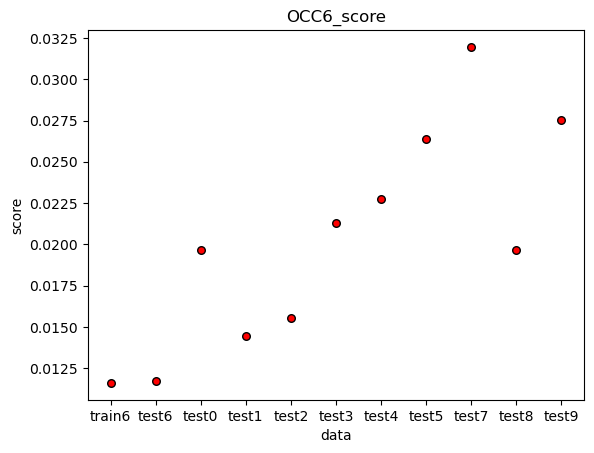

time: 172 ms (started: 2022-12-14 05:20:02 +09:00)


In [122]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC6_score") 
plt.scatter(x=["train6",'test6','test0','test1','test2','test3','test4','test5','test7','test8','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC6/qsvdd/OCC6_score.png')
plt.show()

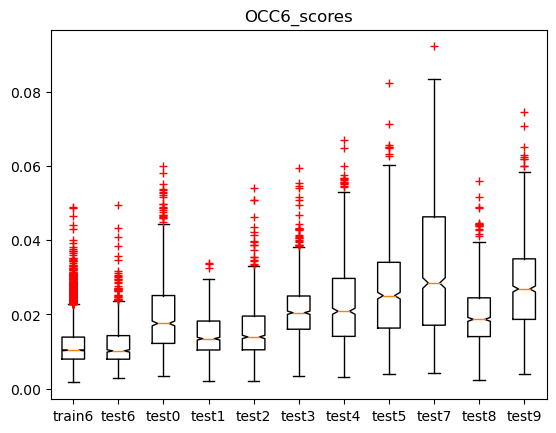

time: 218 ms (started: 2022-12-14 05:20:02 +09:00)


In [123]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC6_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train6",'test6','test0','test1','test2','test3','test4','test5','test7','test8','test9'])
plt.savefig('./img/OCC6/qsvdd/OCC6_scores.png')
plt.show()




### AUROC

In [124]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:20:02 +09:00)


In [125]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 16 ms (started: 2022-12-14 05:20:02 +09:00)


In [126]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)

time: 2.92 s (started: 2022-12-14 05:20:02 +09:00)


In [127]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 0 ns (started: 2022-12-14 05:20:05 +09:00)


In [128]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 0 ns (started: 2022-12-14 05:20:05 +09:00)


In [129]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:20:05 +09:00)


In [130]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 0 ns (started: 2022-12-14 05:20:05 +09:00)


In [131]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 0 ns (started: 2022-12-14 05:20:05 +09:00)


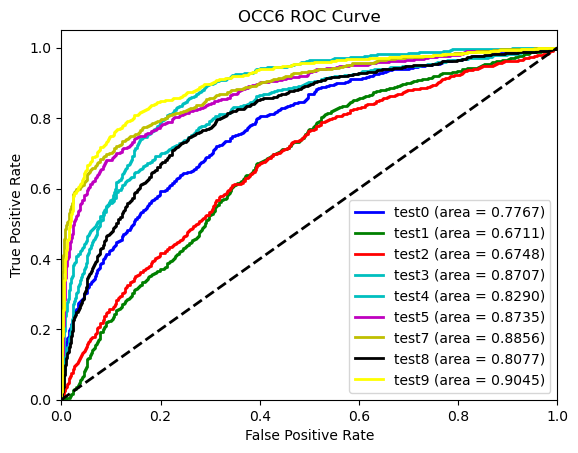

time: 219 ms (started: 2022-12-14 05:20:05 +09:00)


In [132]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test1 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test2 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test3 (area = %0.4f)" % auc4)
plt.plot(fpr5,tpr5,color="c",lw=lw,label="test4 (area = %0.4f)" % auc5)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test5 (area = %0.4f)" % auc6)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test7 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test8 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)




plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC6 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC6/qsvdd/OCC6_ROC.png')
plt.show()

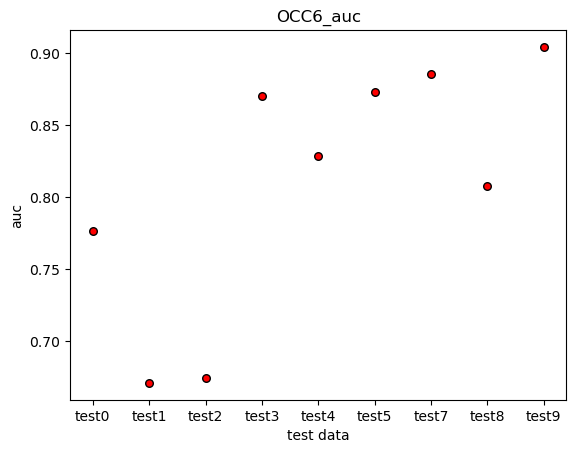

time: 141 ms (started: 2022-12-14 05:20:06 +09:00)


In [133]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC6_auc") 
plt.scatter(x=['test0','test1','test2','test3','test4','test5','test7','test8','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC6/qsvdd/OCC6_auc.png')
plt.show()

In [134]:
print(auc)

[0.7767393805121213, 0.6711439949233443, 0.6747817238756453, 0.8707424709067985, 0.8290384710008926, 0.8735495707707419, 0.8856049405782149, 0.807696347198347, 0.9045490377831252]
time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


In [135]:
savetxt('./img/OCC6/qsvdd/auc_OCC6.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


In [136]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true5,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


In [137]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


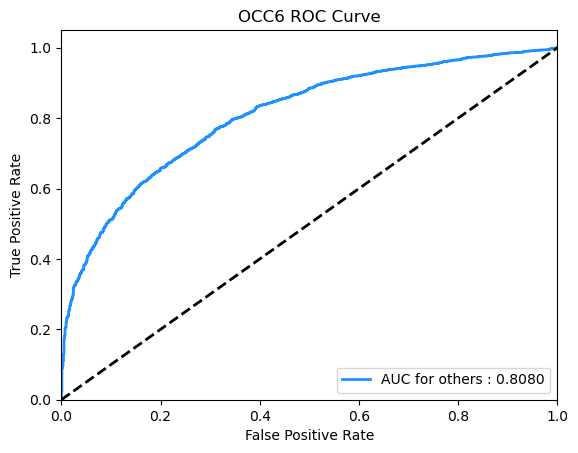

time: 156 ms (started: 2022-12-14 05:20:06 +09:00)


In [138]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC6 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC6/qsvdd/OCC6_ROC_all.png')
plt.show()

In [139]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


In [140]:
auc

[0.7767393805121213,
 0.6711439949233443,
 0.6747817238756453,
 0.8707424709067985,
 0.8290384710008926,
 0.8735495707707419,
 0.8856049405782149,
 0.807696347198347,
 0.9045490377831252,
 0.8079930005710474]

time: 0 ns (started: 2022-12-14 05:20:06 +09:00)


In [141]:
savetxt('./img/OCC6/qsvdd/auc_OCC6.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:20:06 +09:00)
